In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import cv2
import pandas as pd
import seaborn as sns
import sklearn 
# import metric
import umap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import sklearn.cluster as cluster
import torch
import umap
from sklearn.preprocessing import StandardScaler

# Loss analysis

In [2]:
rootdir = '/gpfsscratch/rech/ohv/ueu39kt/TumorNoTumor_fromMNISNOTMDN2_res'
lossfile = 'lossclean_sample3_test.csv'

In [3]:
df_loss = pd.read_csv(os.path.join(rootdir, lossfile), header = None, sep = ',')

In [4]:
df_loss.head()

,0,1
0,0,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...
1,1,0.0324298292398452
2,2,0.753383994102478
3,0,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...
4,1,0.0236135013401508


In [5]:
df_loss.shape

(132102, 2)

In [6]:
filenames = []
mse = []
ssim = [] 
for i in range(df_loss.shape[0]):
    if df_loss.iloc[i,0] == 0:
        filenames.append(df_loss.iloc[i,1])
    elif df_loss.iloc[i,0] == 1:
        mse.append(df_loss.iloc[i,1])
    else:
        ssim.append(df_loss.iloc[i,1])

In [7]:
clean_loss = pd.DataFrame()
clean_loss['filename'] = filenames
clean_loss['mse'] = mse
clean_loss['ssim'] = ssim

In [8]:
clean_loss =  clean_loss.drop_duplicates()

In [9]:
len(set(clean_loss['filename']))

44034

In [10]:
sample_id = []
for i in range(clean_loss.shape[0]):
    imgname =  clean_loss.iloc[i,0]
    sample_id.append(imgname.split('/')[-3])

In [11]:
clean_loss['sample_id'] = sample_id

In [12]:
set(clean_loss['sample_id'] )

{'TNE0001',
 'TNE0002',
 'TNE0003',
 'TNE0004',
 'TNE0005',
 'TNE0006',
 'TNE0007',
 'TNE0008',
 'TNE0009',
 'TNE0011',
 'TNE0015',
 'TNE0016',
 'TNE0017',
 'TNE0018',
 'TNE0019',
 'TNE0025',
 'TNE0027',
 'TNE0028',
 'TNE0031',
 'TNE0033',
 'TNE0034',
 'TNE0056',
 'TNE0057',
 'TNE0058',
 'TNE0060',
 'TNE0061',
 'TNE0066',
 'TNE0067',
 'TNE0069',
 'TNE0071',
 'TNE0072',
 'TNE0073',
 'TNE0075',
 'TNE0077',
 'TNE0078',
 'TNE0079',
 'TNE0080',
 'TNE0081',
 'TNE0117',
 'TNE0180',
 'TNE0181',
 'TNE0227',
 'TNE0228',
 'TNE0229',
 'TNE0230',
 'TNE0231',
 'TNE0232',
 'TNE0233',
 'TNE0234',
 'TNE0235',
 'TNE0263',
 'TNE0277',
 'TNE0278',
 'TNE0286',
 'TNE0287',
 'TNE0288',
 'TNE0289',
 'TNE0305',
 'TNE0306',
 'TNE0308',
 'TNE0340',
 'TNE0341',
 'TNE0360',
 'TNE0387',
 'TNE0390',
 'TNE0403',
 'TNE0404',
 'TNE0405',
 'TNE0406',
 'TNE0407',
 'TNE0408',
 'TNE0416',
 'TNE0417',
 'TNE0450',
 'TNE0451',
 'TNE0452',
 'TNE0477',
 'TNE0478',
 'TNE0479',
 'TNE0480',
 'TNE0484',
 'TNE0485',
 'TNE0486',
 'TN

In [14]:
for s in set(clean_loss['sample_id']):
    print(s,clean_loss[clean_loss['sample_id'] == s].shape[0] )

TNE0278 492
TNE0883 47
TNE0860 131
TNE2122 95
TNE0774 69
TNE1420 30
TNE0505 414
TNE0305 56
TNE0972 104
TNE0545 307
TNE0340 100
TNE0011 194
TNE1003 134
TNE1006 13
TNE1448 129
TNE1356 160
TNE0522 108
TNE0390 232
TNE0027 169
TNE1017 70
TNE0949 101
TNE0028 31
TNE1075 207
TNE0567 485
TNE0228 124
TNE0878 148
TNE1417 75
TNE1095 36
TNE0406 122
TNE1093 98
TNE0805 87
TNE1077 147
TNE0078 20
TNE0873 111
TNE0263 30
TNE0543 94
TNE0079 59
TNE1008 81
TNE0019 12
TNE1026 28
TNE1078 39
TNE0008 44
TNE0795 30
TNE1102 83
TNE1422 58
TNE1410 105
TNE0006 63
TNE1490 85
TNE0387 127
TNE1425 99
TNE0981 80
TNE0403 272
TNE1434 65
TNE0003 19
TNE0997 153
TNE0950 100
TNE0407 79
TNE0500 599
TNE2117 30
TNE0895 75
TNE0959 44
TNE0075 102
TNE1424 27
TNE0797 162
TNE1099 149
TNE0117 100
TNE1011 32
TNE0477 436
TNE1409 46
TNE1427 125
TNE1440 163
TNE2104 63
TNE0988 148
TNE0956 77
TNE0806 246
TNE0589 491
TNE1334 76
TNE0551 50
TNE0561 58
TNE1456 86
TNE1436 146
TNE0230 80
TNE0568 462
TNE1091 63
TNE0869 49
TNE0564 156
TNE1421 129
TN

In [16]:
clean_loss.to_csv('/gpfswork/rech/ohv/ueu39kt/TumorNoTumor_fromMNISNOTMDN2/loss_clean_NOMDN.csv')

In [59]:
df_loss_TNE1019 = clean_loss[clean_loss['sample_id'] == 'TNE2136']

In [60]:
img_TNE1019 = list(set(list(df_loss_TNE1019.iloc[:,0])))
df_img_TNE1019 = pd.DataFrame(img_TNE1019)

In [61]:
df_img_TNE1019.head()
df_img_TNE1019 = df_img_TNE1019.rename(columns={0: "filename"})

In [62]:
df_img_TNE1019.head()

,filename
0,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...
1,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...
2,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...
3,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...
4,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...


In [63]:
df_loss_TNE1019 = df_img_TNE1019.merge(df_loss_TNE1019, how = 'left', on='filename')

In [64]:
df_loss_TNE1019.shape

(95, 4)

In [67]:
clean_loss.head()

,filename,mse,ssim,sample_id
0,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.0324298292398452,0.753383994102478,TNE0305
1,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.0236135013401508,0.8452655076980591,TNE1092
2,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.0148474927991628,0.6449673771858215,TNE0590
3,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.0226374994963407,0.7560751438140869,TNE1356
4,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.0248803850263357,0.780855655670166,TNE0493


In [69]:
clean_loss[clean_loss['sample_id'] == 'TNE0305']

56

In [8]:
df_loss.shape

(132102, 2)

In [9]:
df_loss.shape[0] / 3

44034.0

In [10]:
df_loss_sample = df_loss.iloc[:100000,:]

In [11]:
clean_loss.head()

,filename,mse,ssim
0,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.0324298292398452,0.753383994102478
1,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.0236135013401508,0.8452655076980591
2,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.0148474927991628,0.6449673771858215
3,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.0226374994963407,0.7560751438140869
4,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.0248803850263357,0.780855655670166


In [20]:
filenames

[]

In [41]:
i = 9
df_loss.iloc[100,:]

0    1,0.028050247579813
1                    NaN
Name: 100, dtype: object

In [38]:
df_loss.head()

,0,1
0,0,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...
1,1,0.0319945029914379
2,2,0.8710238337516785
3,0,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...
4,1,0.0208473559468984


In [14]:
clean_loss.head()

,filename,mse,ssim
0,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.0324298292398452,0.753383994102478
1,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.0236135013401508,0.8452655076980591
2,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.0148474927991628,0.6449673771858215
3,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.0226374994963407,0.7560751438140869
4,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.0248803850263357,0.780855655670166


In [87]:
clean_loss["mse"] = pd.to_numeric(clean_loss["mse"])
clean_loss["ssim"] = pd.to_numeric(clean_loss["ssim"])

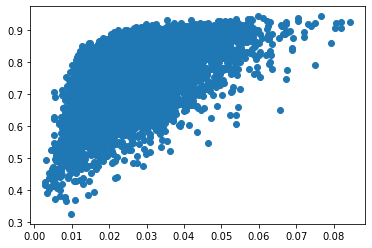

In [88]:


plt.scatter(
    clean_loss.iloc[:10000, 1],
    clean_loss.iloc[:10000, 2]

)

In [91]:
df_loss_sample = clean_loss
df_loss_sample.head()

,filename,mse,ssim,sample_id
0,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.032430,0.753384,TNE0305
1,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.023614,0.845266,TNE1092
2,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.014847,0.644967,TNE0590
3,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.022637,0.756075,TNE1356
4,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.024880,0.780856,TNE0493


In [92]:
to_print_c0 = list(set(df_loss_sample.sort_values(by='mse', axis=0, ascending = True).iloc[:1000,0].values))

In [93]:
to_print_c0

['/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0534/accept/TNE0534_6931_85933.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0536/accept/TNE0536_30955_78079.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0531/accept/TNE0531_40195_64681.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0526/accept/TNE0526_46201_58675.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0451/accept/TNE0451_29569_42505.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0575/accept/TNE0575_36961_88705.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0277/accept/TNE0277_52207_38809.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0452/accept/TNE0452_29569_115963.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0531/accept/TNE0531_42043_60523.jpg',
 

In [30]:
len(to_print_c0)

1000

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0061/accept/TNE0061_16633_25873.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0524/accept/TNE0524_41581_84547.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0531/accept/TNE0531_23101_67915.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0529/accept/TNE0529_102565_39733.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0545/accept/TNE0545_44815_69301.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0452/accept/TNE0452_44815_111343.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0516/accept/TNE0516_32803_137677.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0531/accept/TNE0531_44353_57751.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1002/accept/TNE1002_36961_10627.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tile

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0876/accept/TNE0876_70225_26797.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0516/accept/TNE0516_53593_27721.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0515/accept/TNE0515_7393_83623.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0545/accept/TNE0545_24025_88705.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0515/accept/TNE0515_26797_68377.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0529/accept/TNE0529_23101_56365.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0525/accept/TNE0525_48049_72073.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0522/accept/TNE0522_11551_61909.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0521/accept/TNE0521_31879_73921.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_51

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0277/accept/TNE0277_18481_41581.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0519/accept/TNE0519_26335_88705.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0508/accept/TNE0508_28183_55441.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0505/accept/TNE0505_43429_87781.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0503/accept/TNE0503_23101_64219.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0516/accept/TNE0516_50359_23563.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0534/accept/TNE0534_21715_56365.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0519/accept/TNE0519_37885_54055.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0526/accept/TNE0526_36037_104413.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0524/accept/TNE0524_33265_82237.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0570/accept/TNE0570_36037_44353.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0516/accept/TNE0516_18943_60061.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0521/accept/TNE0521_28183_109957.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0531/accept/TNE0531_34651_42043.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0516/accept/TNE0516_12013_46201.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0591/accept/TNE0591_24949_53131.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0495/accept/TNE0495_40657_59137.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0531/accept/TNE0531_26797_73921.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0516/accept/TNE0516_23563_46663.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0500/accept/TNE0500_6007_23101.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0542/accept/TNE0542_12937_58213.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0494/accept/TNE0494_22177_101179.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0542/accept/TNE0542_4621_20329.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0515/accept/TNE0515_3235_62833.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0504/accept/TNE0504_49897_46201.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0494/accept/TNE0494_14785_40195.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0479/accept/TNE0479_60985_63757.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0509/accept/TNE0509_35575_92401.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0008/accept/TNE0008_12013_8317.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0479/accept/TNE0479_24949_138139.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0278/accept/TNE0278_12013_75307.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0510/accept/TNE0510_26335_17557.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0519/accept/TNE0519_51745_76693.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0508/accept/TNE0508_43891_36961.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0519/accept/TNE0519_56365_74383.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0479/accept/TNE0479_81313_44353.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_5

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0528/accept/TNE0528_36499_80851.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0515/accept/TNE0515_12937_73921.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0530/accept/TNE0530_45277_32803.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0495/accept/TNE0495_33727_78079.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0479/accept/TNE0479_49897_48973.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0516/accept/TNE0516_19867_27259.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0531/accept/TNE0531_19867_48973.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0545/accept/TNE0545_55441_71149.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0498/accept/TNE0498_3235_105337.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_5

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0494/accept/TNE0494_38347_74845.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0520/accept/TNE0520_7393_133981.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0516/accept/TNE0516_41119_24487.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0479/accept/TNE0479_51745_43429.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0500/accept/TNE0500_47587_141835.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0015/accept/TNE0015_21253_30493.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0479/accept/TNE0479_23563_131209.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0452/accept/TNE0452_42967_62833.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0277/accept/TNE0277_30955_29569.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0545/accept/TNE0545_52669_73459.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0519/accept/TNE0519_21253_89167.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0516/accept/TNE0516_42043_38809.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0884/accept/TNE0884_72073_56365.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0510/accept/TNE0510_15247_127051.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0495/accept/TNE0495_60985_91939.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0522/accept/TNE0522_36961_113653.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0494/accept/TNE0494_57751_75307.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0936/accept/TNE0936_36037_134443.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tile

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0515/accept/TNE0515_13861_71611.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1094/accept/TNE1094_25411_30493.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0522/accept/TNE0522_42967_109957.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0520/accept/TNE0520_22177_128437.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0522/accept/TNE0522_42043_108571.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0516/accept/TNE0516_25873_123355.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0277/accept/TNE0277_33265_33265.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0278/accept/TNE0278_21253_93325.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0567/accept/TNE0567_25411_112267.jpg
/gpfsscratch/rech/ohv/ueu39kt/Ti

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0530/accept/TNE0530_30955_41119.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0278/accept/TNE0278_31417_65143.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0516/accept/TNE0516_44815_109033.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0576/accept/TNE0576_35575_82699.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0503/accept/TNE0503_20329_60523.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0500/accept/TNE0500_55903_110419.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0554/accept/TNE0554_29569_67453.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0516/accept/TNE0516_32341_127975.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0531/accept/TNE0531_20329_60985.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tile

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0567/accept/TNE0567_32341_113653.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0277/accept/TNE0277_24025_46663.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0528/accept/TNE0528_33727_65143.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0519/accept/TNE0519_48049_77155.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0519/accept/TNE0519_43429_78079.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0494/accept/TNE0494_10627_98407.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0531/accept/TNE0531_37885_46663.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0516/accept/TNE0516_41119_119659.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0498/accept/TNE0498_25411_118735.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tile

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0516/accept/TNE0516_33265_39271.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0515/accept/TNE0515_26797_72073.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0516/accept/TNE0516_43891_35113.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0547/accept/TNE0547_42967_135367.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0519/accept/TNE0519_42043_64219.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0516/accept/TNE0516_26797_61447.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0479/accept/TNE0479_22177_137677.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0278/accept/TNE0278_52207_48049.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0519/accept/TNE0519_90553_63757.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles

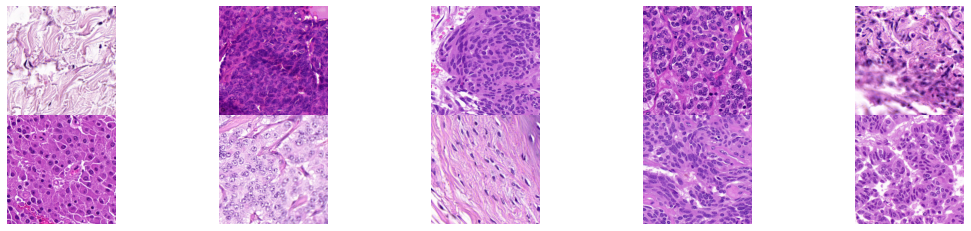

In [94]:
 c  = 0 
fig, axs = plt.subplots(2,5, figsize=(19, 4), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace =0, wspace=0)
row2 = False
for ele in to_print_c0:
    try:
        im = cv2.imread(ele)
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        if row2 == False:
            if c < 5:
                axs[0,c].imshow(im)
                axs[0,c].axis('off')
                c+=1
            elif c == 5:
                c = 0 
                row2 = True
                axs[1,c].imshow(im)
                axs[1,c].axis('off')
                c +=1

        else:
            axs[1,c].imshow(im)
            axs[1,c].axis('off')
            c+=1
    except:
        print(ele)


In [95]:
to_print_c0 = list(set(df_loss_sample.sort_values(by='mse', axis=0, ascending = False).iloc[:1000,0].values))

In [33]:
to_print_c0

['/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0997/accept/TNE0997_10627_6007.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0406/accept/TNE0406_29107_16633.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0986/accept/TNE0986_39733_23101.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0499/accept/TNE0499_33727_96097.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1450/accept/TNE1450_47125_66529.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0231/accept/TNE0231_83161_41581.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0390/accept/TNE0390_33265_43891.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0998/accept/TNE0998_44353_7855.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0231/accept/TNE0231_60061_60985.jpg',
 '/

In [34]:
len(to_print_c0)

1000

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE2122/accept/TNE2122_51745_56365.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0077/accept/TNE0077_58213_35113.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0979/accept/TNE0979_24949_10165.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1407/accept/TNE1407_42505_19405.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1442/accept/TNE1442_70225_69301.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0027/accept/TNE0027_60985_61909.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1419/accept/TNE1419_53593_24025.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0499/accept/TNE0499_20791_100255.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0406/accept/TNE0406_15709_15247.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0555/accept/TNE0555_10165_19405.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1079/accept/TNE1079_15247_28645.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0986/accept/TNE0986_18481_2311.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0451/accept/TNE0451_11089_48049.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0551/accept/TNE0551_7855_18019.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0484/accept/TNE0484_35575_91015.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0072/accept/TNE0072_8317_34189.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0997/accept/TNE0997_38809_21715.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE2127/accept/TNE2127_51745_38809.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0390/accept/TNE0390_34651_12475.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0235/accept/TNE0235_57289_11089.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0508/accept/TNE0508_25411_119659.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0865/accept/TNE0865_45277_36037.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0009/accept/TNE0009_83161_28645.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0406/accept/TNE0406_39271_11551.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0387/accept/TNE0387_21253_24949.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0806/accept/TNE0806_85009_81313.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0997/accept/TNE0997_26335_11551.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE2127/accept/TNE2127_75769_20329.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0865/accept/TNE0865_52669_56365.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0894/accept/TNE0894_78541_38809.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0869/accept/TNE0869_38809_62833.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0975/accept/TNE0975_22639_28645.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0484/accept/TNE0484_46201_79003.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0797/accept/TNE0797_40657_23101.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1094/accept/TNE1094_4621_14323.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0882/accept/TNE0882_60061_50821.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_51

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0878/accept/TNE0878_43429_52669.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0551/accept/TNE0551_4621_17095.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0006/accept/TNE0006_95173_4621.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0870/accept/TNE0870_45277_49897.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0881/accept/TNE0881_38809_40657.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0985/accept/TNE0985_42043_25411.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0973/accept/TNE0973_40657_30031.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0882/accept/TNE0882_46201_41581.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0551/accept/TNE0551_4621_12475.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0542/accept/TNE0542_63757_26797.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1499/accept/TNE1499_29569_25873.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0873/accept/TNE0873_18481_47125.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0873/accept/TNE0873_16633_44353.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1416/accept/TNE1416_48049_14785.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0980/accept/TNE0980_33727_13861.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1008/accept/TNE1008_13861_20791.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0075/accept/TNE0075_70225_24949.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0406/accept/TNE0406_39271_4159.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_51

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1367/accept/TNE1367_80389_72997.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE2155/accept/TNE2155_67453_28645.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0390/accept/TNE0390_22177_17557.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1101/accept/TNE1101_43429_34189.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1436/accept/TNE1436_76693_37885.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0005/accept/TNE0005_24025_9241.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0953/accept/TNE0953_18481_19405.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0405/accept/TNE0405_33727_16171.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0997/accept/TNE0997_27259_30493.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_51

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0956/accept/TNE0956_51283_35575.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0508/accept/TNE0508_37885_37885.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE2149/accept/TNE2149_121969_62833.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0499/accept/TNE0499_32341_89167.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0227/accept/TNE0227_15709_5545.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0001/accept/TNE0001_23101_11089.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0980/accept/TNE0980_50359_18481.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0898/accept/TNE0898_35113_44353.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0805/accept/TNE0805_34189_46201.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_5

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0005/accept/TNE0005_23101_9241.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0056/accept/TNE0056_56365_28645.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0985/accept/TNE0985_20791_23101.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0997/accept/TNE0997_29569_30493.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0980/accept/TNE0980_30955_20791.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0499/accept/TNE0499_23101_102565.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1088/accept/TNE1088_7393_17557.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0227/accept/TNE0227_13861_20329.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0001/accept/TNE0001_19405_36961.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_51

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1450/accept/TNE1450_64681_60985.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0056/accept/TNE0056_54517_32341.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1452/accept/TNE1452_67453_27721.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0340/accept/TNE0340_16633_21253.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0009/accept/TNE0009_80389_28645.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0574/accept/TNE0574_81313_5545.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0998/accept/TNE0998_26797_2311.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0886/accept/TNE0886_72997_22177.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE2142/accept/TNE2142_69301_44353.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1094/accept/TNE1094_20791_21715.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1436/accept/TNE1436_74845_22177.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1419/accept/TNE1419_21253_33265.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0551/accept/TNE0551_10165_13399.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1088/accept/TNE1088_24487_14785.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0981/accept/TNE0981_29107_13399.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0953/accept/TNE0953_24025_29569.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0009/accept/TNE0009_76693_53593.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1407/accept/TNE1407_42967_16633.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_5

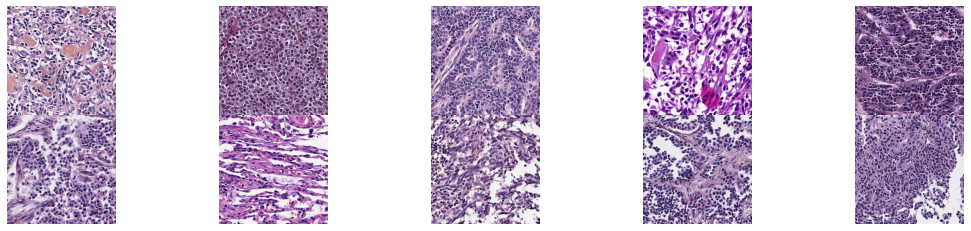

In [35]:
 c  = 0 
fig, axs = plt.subplots(2,5, figsize=(19, 4), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace =0, wspace=0)
row2 = False
for ele in to_print_c0:
    try:
        im = cv2.imread(ele)
        
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        if row2 == False:
            if c < 5:
                axs[0,c].imshow(im)
                axs[0,c].axis('off')
                c+=1
            elif c == 5:
                c = 0 
                row2 = True
                axs[1,c].imshow(im)
                axs[1,c].axis('off')
                c +=1

        else:
            axs[1,c].imshow(im)
            axs[1,c].axis('off')
            c+=1
    except:
        print(ele)

In [36]:
to_print_c0 = list(set(df_loss_sample.sort_values(by='ssim', axis=0, ascending = True).iloc[:1000,0].values))

In [37]:
to_print_c0

['/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0545/accept/TNE0545_40657_89167.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0590/accept/TNE0590_30493_96559.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0883/accept/TNE0883_41581_22177.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0516/accept/TNE0516_50821_101179.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0525/accept/TNE0525_47587_42043.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0479/accept/TNE0479_37885_129823.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0529/accept/TNE0529_32341_106261.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0288/accept/TNE0288_21715_51745.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0534/accept/TNE0534_52669_71149.jpg'

In [38]:
len(to_print_c0)

1000

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0547/accept/TNE0547_7855_126127.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0287/accept/TNE0287_24025_109495.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0535/accept/TNE0535_13399_119197.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0494/accept/TNE0494_12013_45739.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0529/accept/TNE0529_40195_43891.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0287/accept/TNE0287_58213_113191.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0451/accept/TNE0451_54517_4621.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0522/accept/TNE0522_20329_87319.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0516/accept/TNE0516_53593_27721.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0534/accept/TNE0534_24949_45739.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0516/accept/TNE0516_46201_115039.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0535/accept/TNE0535_6931_115501.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0516/accept/TNE0516_31417_107185.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0521/accept/TNE0521_3697_72535.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0510/accept/TNE0510_38347_53131.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0531/accept/TNE0531_19867_36037.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0287/accept/TNE0287_9241_112729.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0536/accept/TNE0536_33727_83623.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0564/accept/TNE0564_31879_75307.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0555/accept/TNE0555_11089_126127.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0519/accept/TNE0519_56365_74383.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0521/accept/TNE0521_40657_48973.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0524/accept/TNE0524_42967_24949.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0531/accept/TNE0531_52207_69763.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0530/accept/TNE0530_15247_94711.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0531/accept/TNE0531_925_59137.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0535/accept/TNE0535_16633_127513.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_5

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0530/accept/TNE0530_12475_77155.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0508/accept/TNE0508_21715_104413.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0530/accept/TNE0530_9241_104413.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0495/accept/TNE0495_58675_77155.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0963/accept/TNE0963_41119_20791.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0510/accept/TNE0510_39271_83623.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0565/accept/TNE0565_42967_54517.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0287/accept/TNE0287_42967_80389.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0576/accept/TNE0576_44815_98407.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0516/accept/TNE0516_49897_100717.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0516/accept/TNE0516_48973_30493.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0521/accept/TNE0521_21253_57289.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0521/accept/TNE0521_37423_60061.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0521/accept/TNE0521_19405_99331.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0530/accept/TNE0530_49897_87319.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0521/accept/TNE0521_2773_64219.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0519/accept/TNE0519_27721_72073.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0531/accept/TNE0531_8317_72535.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_51

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0525/accept/TNE0525_17095_41119.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0555/accept/TNE0555_29107_72073.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0519/accept/TNE0519_49897_60061.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0590/accept/TNE0590_57289_61447.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0522/accept/TNE0522_33265_101641.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0277/accept/TNE0277_44815_37885.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0486/accept/TNE0486_35575_100717.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0277/accept/TNE0277_24949_55441.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0954/accept/TNE0954_9241_16633.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0452/accept/TNE0452_29107_125203.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0531/accept/TNE0531_20329_60985.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0515/accept/TNE0515_30955_104875.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0287/accept/TNE0287_54517_104413.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0536/accept/TNE0536_41581_91477.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0535/accept/TNE0535_16171_127513.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0553/accept/TNE0553_62371_45277.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0494/accept/TNE0494_56827_82237.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0452/accept/TNE0452_38809_121507.jpg
/gpfsscratch/rech/ohv/ueu39kt/Ti

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0498/accept/TNE0498_3235_76693.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0452/accept/TNE0452_48973_103951.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0509/accept/TNE0509_42505_97021.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0531/accept/TNE0531_12937_79927.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0521/accept/TNE0521_27721_97483.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0452/accept/TNE0452_28183_124279.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0508/accept/TNE0508_54979_109495.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0516/accept/TNE0516_47587_31417.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0547/accept/TNE0547_37423_48973.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0277/accept/TNE0277_38347_49897.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0567/accept/TNE0567_35575_65143.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0479/accept/TNE0479_26797_80851.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0576/accept/TNE0576_5083_86395.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0553/accept/TNE0553_32803_52669.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0546/accept/TNE0546_36499_45277.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0452/accept/TNE0452_19867_108571.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0534/accept/TNE0534_48973_55903.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0277/accept/TNE0277_10165_46663.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_5

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0519/accept/TNE0519_62371_66991.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0514/accept/TNE0514_7855_79927.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0498/accept/TNE0498_44815_34189.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0477/accept/TNE0477_40195_52669.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0278/accept/TNE0278_36037_30955.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0494/accept/TNE0494_13399_43429.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0522/accept/TNE0522_36499_91939.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0570/accept/TNE0570_53593_71149.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0277/accept/TNE0277_25873_99331.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_51

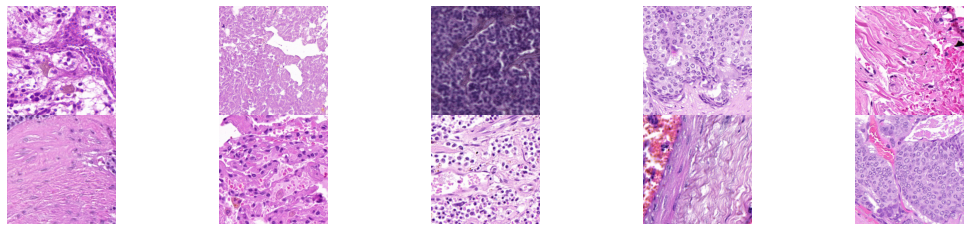

In [39]:
 c  = 0 
fig, axs = plt.subplots(2,5, figsize=(19, 4), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace =0, wspace=0)
row2 = False
for ele in to_print_c0:
    try:
        im = cv2.imread(ele)
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        if row2 == False:
            if c < 5:
                axs[0,c].imshow(im)
                axs[0,c].axis('off')
                c+=1
            elif c == 5:
                c = 0 
                row2 = True
                axs[1,c].imshow(im)
                axs[1,c].axis('off')
                c +=1

        else:
            axs[1,c].imshow(im)
            axs[1,c].axis('off')
            c+=1
    except:
        print(ele)

In [40]:
to_print_c0 = list(set(df_loss_sample.sort_values(by='ssim', axis=0, ascending = False).iloc[:1000,0].values))

In [41]:
to_print_c0

['/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0986/accept/TNE0986_39733_23101.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0406/accept/TNE0406_29107_16633.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1413/accept/TNE1413_31417_36961.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0403/accept/TNE0403_24487_30955.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1450/accept/TNE1450_47125_66529.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0406/accept/TNE0406_23563_15247.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0027/accept/TNE0027_47125_36037.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0866/accept/TNE0866_59137_40657.jpg',
 '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1408/accept/TNE1408_28183_15247.jpg',
 

In [42]:
len(to_print_c0)

1000

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0404/accept/TNE0404_21253_26797.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0228/accept/TNE0228_77617_21253.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1407/accept/TNE1407_42505_19405.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0542/accept/TNE0542_12937_54517.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1419/accept/TNE1419_53593_24025.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0500/accept/TNE0500_28645_60061.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0404/accept/TNE0404_20791_19405.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0551/accept/TNE0551_6469_18943.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0406/accept/TNE0406_15709_15247.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_51

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0963/accept/TNE0963_39271_4159.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0589/accept/TNE0589_8317_42505.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0973/accept/TNE0973_20791_2773.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1086/accept/TNE1086_4159_6931.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE2158/accept/TNE2158_101641_34189.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1419/accept/TNE1419_63757_22177.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0027/accept/TNE0027_42505_56365.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0306/accept/TNE0306_39271_18481.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0011/accept/TNE0011_38809_55441.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_5

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0306/accept/TNE0306_16633_21253.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1408/accept/TNE1408_29107_12475.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE2158/accept/TNE2158_43429_29569.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE2158/accept/TNE2158_41581_12937.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0981/accept/TNE0981_42043_12937.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0873/accept/TNE0873_31417_65605.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0406/accept/TNE0406_30031_12013.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1413/accept/TNE1413_50821_9241.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0306/accept/TNE0306_29569_14785.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_51

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1436/accept/TNE1436_86857_25873.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0981/accept/TNE0981_39733_12475.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0009/accept/TNE0009_90553_10165.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0306/accept/TNE0306_10627_15709.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0876/accept/TNE0876_62833_76693.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0011/accept/TNE0011_47125_42505.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1002/accept/TNE1002_26797_31417.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0306/accept/TNE0306_20791_22639.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0306/accept/TNE0306_19405_39271.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_5

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0056/accept/TNE0056_76693_38809.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0011/accept/TNE0011_21253_60985.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1008/accept/TNE1008_30955_24025.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0306/accept/TNE0306_38347_18943.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0406/accept/TNE0406_22177_18019.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0306/accept/TNE0306_32803_28645.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0025/accept/TNE0025_45277_23101.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1101/accept/TNE1101_61909_26335.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0025/accept/TNE0025_37885_49897.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_5

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0341/accept/TNE0341_83161_13861.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0893/accept/TNE0893_71149_53593.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0306/accept/TNE0306_31879_25873.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0805/accept/TNE0805_58213_48973.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0894/accept/TNE0894_50821_39733.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0872/accept/TNE0872_68377_36037.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0406/accept/TNE0406_6007_22639.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0306/accept/TNE0306_27721_33265.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0975/accept/TNE0975_16171_9241.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1431/accept/TNE1431_35113_20329.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0962/accept/TNE0962_9241_25411.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0873/accept/TNE0873_14785_49897.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0406/accept/TNE0406_47125_18481.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0387/accept/TNE0387_48973_24487.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1413/accept/TNE1413_28645_38809.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0973/accept/TNE0973_52207_14323.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0231/accept/TNE0231_60061_67453.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0876/accept/TNE0876_72997_69301.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_51

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0009/accept/TNE0009_75769_28645.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0406/accept/TNE0406_18481_20791.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0278/accept/TNE0278_47125_31417.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0542/accept/TNE0542_43429_65605.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1436/accept/TNE1436_61909_53593.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1356/accept/TNE1356_17557_45277.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0936/accept/TNE0936_68377_6469.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0009/accept/TNE0009_54517_69301.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0406/accept/TNE0406_37423_24949.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_51

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0809/accept/TNE0809_66529_17557.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0551/accept/TNE0551_5545_12013.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1089/accept/TNE1089_54055_18481.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0234/accept/TNE0234_54517_56365.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0005/accept/TNE0005_23101_9241.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0873/accept/TNE0873_9241_44353.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0227/accept/TNE0227_5545_36037.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0075/accept/TNE0075_72997_25873.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0872/accept/TNE0872_76693_52669.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_5

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1416/accept/TNE1416_32341_16633.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0306/accept/TNE0306_13399_29569.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1075/accept/TNE1075_6007_31879.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0407/accept/TNE0407_10627_15247.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0567/accept/TNE0567_36037_6469.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0954/accept/TNE0954_46201_10627.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0009/accept/TNE0009_80389_28645.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE2158/accept/TNE2158_60061_9241.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0387/accept/TNE0387_32341_36499.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_

/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0873/accept/TNE0873_22177_75769.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1450/accept/TNE1450_25873_66529.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0986/accept/TNE0986_36961_3697.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1356/accept/TNE1356_60061_32341.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE1419/accept/TNE1419_21253_33265.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0009/accept/TNE0009_23101_57289.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0878/accept/TNE0878_43429_42505.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0009/accept/TNE0009_58213_42505.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0405/accept/TNE0405_6469_34651.jpg
/gpfsscratch/rech/ohv/ueu39kt/Tiles_512

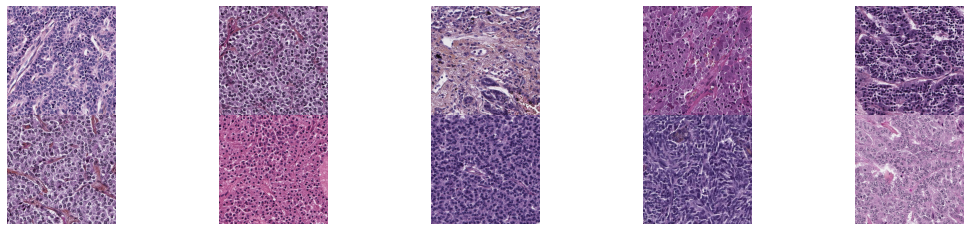

In [43]:
 c  = 0 
fig, axs = plt.subplots(2,5, figsize=(19, 4), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace =0, wspace=0)
row2 = False
for ele in to_print_c0:
    try:
        im = cv2.imread(ele)
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        if row2 == False:
            if c < 5:
                axs[0,c].imshow(im)
                axs[0,c].axis('off')
                c+=1
            elif c == 5:
                c = 0 
                row2 = True
                axs[1,c].imshow(im)
                axs[1,c].axis('off')
                c +=1

        else:
            axs[1,c].imshow(im)
            axs[1,c].axis('off')
            c+=1
    except:
        print(ele)

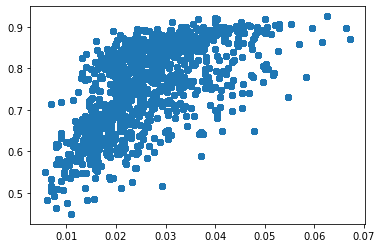

In [45]:


plt.scatter(
    df_loss_sample.iloc[:, 1],
    df_loss_sample.iloc[:, 2],

)



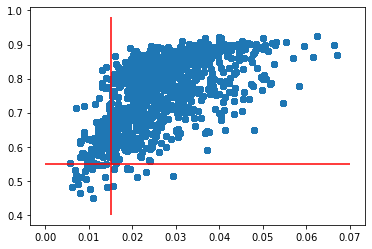

In [59]:
c

In [64]:
blc = list(set(df_loss_sample[(df_loss_sample.iloc[:,1] <= 0.015) & (df_loss_sample.iloc[:,2] <= 0.55) ].iloc[:,0].values))[:20]

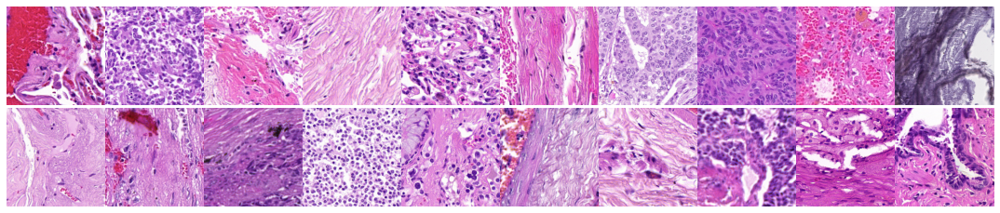

In [65]:
 c  = 0 
fig, axs = plt.subplots(2,10, figsize=(19, 4), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace =0, wspace=0)
row2 = False
for ele in blc:
    try:
        im = cv2.imread(ele)
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        if row2 == False:
            if c < 10:
                axs[0,c].imshow(im)
                axs[0,c].axis('off')
                c+=1
            elif c == 10:
                c = 0 
                row2 = True
                axs[1,c].imshow(im)
                axs[1,c].axis('off')
                c +=1

        else:
            axs[1,c].imshow(im)
            axs[1,c].axis('off')
            c+=1
    except:
        print(ele)

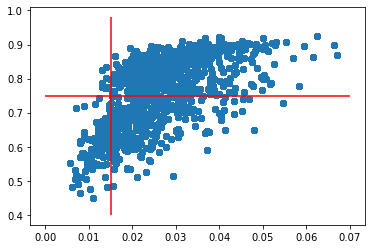

In [66]:
plt.scatter(
    df_loss_sample.iloc[:, 1],
    df_loss_sample.iloc[:, 2],

)
plt.vlines(x = 0.015, ymin = 0.4, ymax = 0.98, colors = 'r')
plt.hlines(y = 0.75, xmin = 0, xmax = 0.07, colors = 'r')

In [73]:
tlc= list(set(df_loss_sample[(df_loss_sample.iloc[:,1] <= 0.015) & (df_loss_sample.iloc[:,2] >= 0.72) ].iloc[:,0].values))

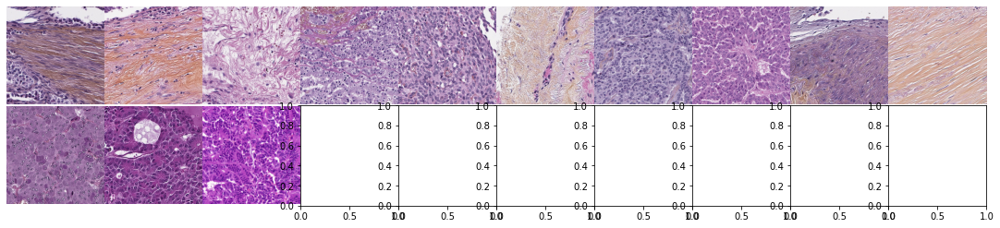

In [76]:
plot20Tiles(tlc)

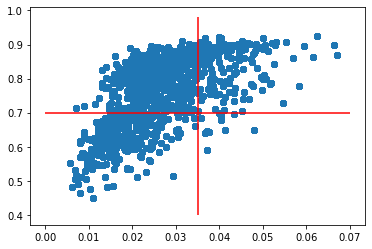

In [79]:
plt.scatter(
    df_loss_sample.iloc[:, 1],
    df_loss_sample.iloc[:, 2],

)
plt.vlines(x = 0.035, ymin = 0.4, ymax = 0.98, colors = 'r')
plt.hlines(y = 0.7, xmin = 0, xmax = 0.07, colors = 'r')

In [84]:
brc=list(set(df_loss_sample[(df_loss_sample.iloc[:,1] >= 0.035) & (df_loss_sample.iloc[:,2] <= 0.72) ].iloc[:,0].values))

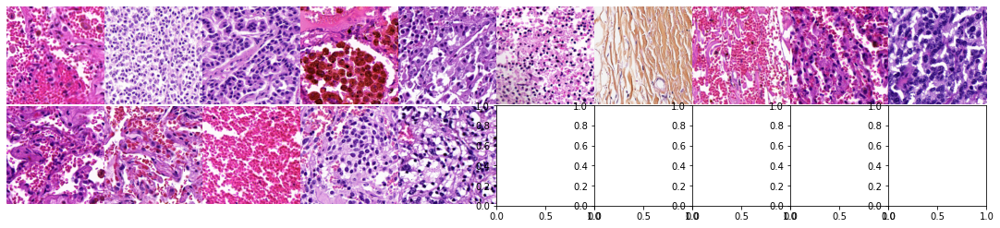

In [85]:
plot20Tiles(brc)

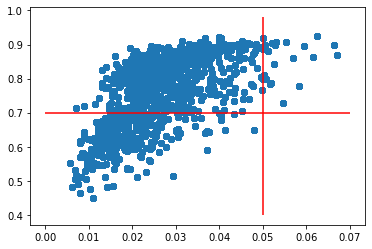

In [90]:
plt.scatter(
    df_loss_sample.iloc[:, 1],
    df_loss_sample.iloc[:, 2],

)
plt.vlines(x = 0.050, ymin = 0.4, ymax = 0.98, colors = 'r')
plt.hlines(y = 0.7, xmin = 0, xmax = 0.07, colors = 'r')

In [93]:
trc = list(set(df_loss_sample[(df_loss_sample.iloc[:,1] >= 0.05) & (df_loss_sample.iloc[:,2] >= 0.72) ].iloc[:,0].values))[:20]

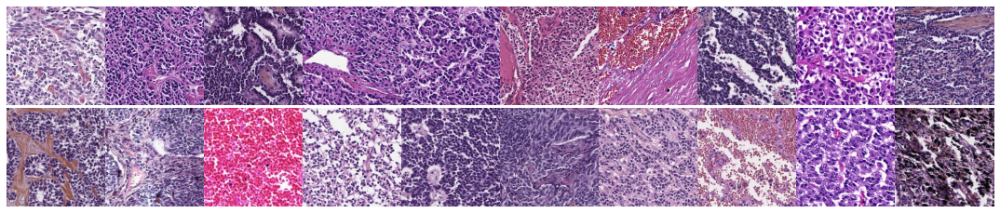

In [94]:
plot20Tiles(trc)

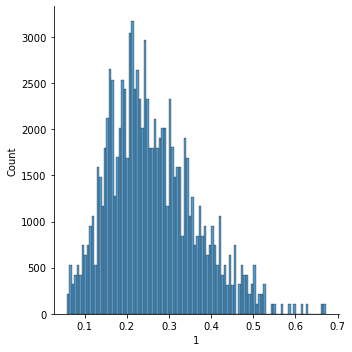

In [102]:
sns.displot(
    df_loss_sample.iloc[:, 1] * 10
)

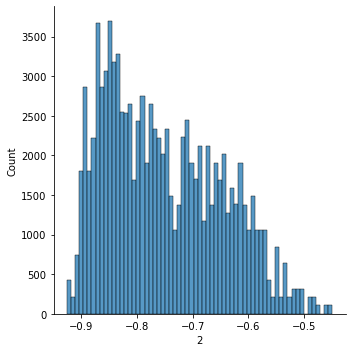

In [99]:
sns.displot(
    df_loss_sample.iloc[:, 2] * (-1)
)

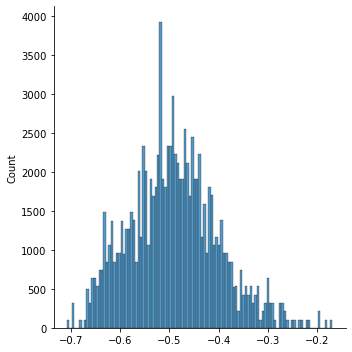

In [101]:
sns.displot(
    df_loss_sample.iloc[:, 2] * (-1) + df_loss_sample.iloc[:, 1] * 10
) 

In [ ]:
 df_loss_sample.iloc[:, 2] * (-1) + df_loss_sample.iloc[:, 1] * 10

In [108]:
df_loss_sample_transform = df_loss_sample
df_loss_sample_transform.iloc[:, 2]   =  df_loss_sample_transform.iloc[:, 2] * (-1)
df_loss_sample_transform.iloc[:, 1]   =  df_loss_sample_transform.iloc[:, 1]# * (10)

/gpfslocalsup/pub/anaconda-py3/2020.02/envs/pytorch-gpu-1.7.0/lib/python3.7/site-packages/pandas/core/indexing.py:1743: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(ilocs[0], value)


In [109]:
df_loss_sample_transform.head()

,0,1,2
0,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,-70.374334,-0.703743
1,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,-70.374334,-0.703743
2,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,-70.374334,-0.703743
3,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,-70.374334,-0.703743
4,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,-70.374334,-0.703743


In [111]:
df_loss_sample.head()

,0,1,2
0,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,-70.374334,-0.703743
1,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,-70.374334,-0.703743
2,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,-70.374334,-0.703743
3,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,-70.374334,-0.703743
4,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,-70.374334,-0.703743


In [8]:
len(set(df_loss.iloc[:,0]))

279126

In [9]:
df_loss.iloc[0,0]

'/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0563/accept/TNE0563_14323_103951.jpg'

In [11]:
df_loss[df_loss.iloc[:,0] == 
        '/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_1802/Tiles_512_512_1802/TNE0563/accept/TNE0563_14323_103951.jpg']

,0,1,2
0,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.015686,0.703743
1,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.015686,0.703743
2,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.015686,0.703743
3,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.015686,0.703743
4,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.015686,0.703743
...,...,...,...
102,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.015686,0.703743
103,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.015686,0.703743
104,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.015686,0.703743
105,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,0.015686,0.703743


In [ ]:
clean_loss = pd.DataFrame()
for f in list(set(df_loss.iloc[:,0])):
    c_df_loss = df_loss[df_loss.iloc[:,0] == f]
    c_df_loss = c_df_loss.iloc[0,:]
    clean_loss = pd.concat([clean_loss, c_df_loss ])

# Encoded vector analysis

In [5]:
vectorf = 'vector.aa'
df_vector = pd.read_csv(os.path.join(rootdir, vectorf ), header = None)

In [6]:
df_vector.shape

(100000, 1001)

In [7]:
df_vector.head()

,0,1,2,3,4,5,6,7,8,9,...,991,992,993,994,995,996,997,998,999,1000
0,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,21.473164,-275.048550,68.275690,14.467163,-354.544770,118.691900,227.583620,-198.887650,56.972538,...,113.503860,-16.454273,-5.552338,-28.213486,317.799740,-11.04277,-99.632750,8.578524,61.705303,-13.664770
1,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,8.366652,-78.169020,48.044678,-233.109190,-88.587470,313.401100,43.650288,-139.823320,-230.856570,...,85.423380,29.655066,-294.999850,4.316826,201.496630,106.69756,-91.729860,-40.145820,-169.644960,8.086246
2,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,-66.834000,46.772766,-33.430225,-25.710170,47.086180,132.297270,-111.786835,79.554930,-114.138360,...,33.707040,-76.761375,-49.116302,-147.883330,39.556805,133.07521,78.498055,92.942245,-252.847370,198.575580
3,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,54.966150,18.575882,23.309769,46.423510,62.092102,73.203180,147.843800,95.467470,22.226917,...,-1.286071,-138.669570,55.931763,240.863980,29.793688,86.46970,-91.871895,-2.716049,-51.035973,291.393130
4,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,-40.265137,-20.360481,19.110956,10.660242,548.602360,-22.346212,-92.782745,3.794258,-48.143925,...,-77.400240,-67.945930,113.547440,-47.162178,-5.612457,-217.64876,-21.703178,153.884640,-28.412903,-92.404015


In [8]:
len(set(df_vector.iloc[:,0]))

100000

In [9]:
sample = []
for i in range(df_vector.shape[0]):
    sample.append(df_vector.iloc[i,0].split('/')[-3])
df_vector['sample'] = sample

In [10]:
df_vector.head()

,0,1,2,3,4,5,6,7,8,9,...,992,993,994,995,996,997,998,999,1000,sample
0,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,21.473164,-275.048550,68.275690,14.467163,-354.544770,118.691900,227.583620,-198.887650,56.972538,...,-16.454273,-5.552338,-28.213486,317.799740,-11.04277,-99.632750,8.578524,61.705303,-13.664770,TNE0563
1,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,8.366652,-78.169020,48.044678,-233.109190,-88.587470,313.401100,43.650288,-139.823320,-230.856570,...,29.655066,-294.999850,4.316826,201.496630,106.69756,-91.729860,-40.145820,-169.644960,8.086246,TNE0568
2,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,-66.834000,46.772766,-33.430225,-25.710170,47.086180,132.297270,-111.786835,79.554930,-114.138360,...,-76.761375,-49.116302,-147.883330,39.556805,133.07521,78.498055,92.942245,-252.847370,198.575580,TNE1003
3,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,54.966150,18.575882,23.309769,46.423510,62.092102,73.203180,147.843800,95.467470,22.226917,...,-138.669570,55.931763,240.863980,29.793688,86.46970,-91.871895,-2.716049,-51.035973,291.393130,TNE1418
4,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,-40.265137,-20.360481,19.110956,10.660242,548.602360,-22.346212,-92.782745,3.794258,-48.143925,...,-67.945930,113.547440,-47.162178,-5.612457,-217.64876,-21.703178,153.884640,-28.412903,-92.404015,TNE0485


In [ ]:
df_vector_values = df_vector.iloc[:,1:-1]
scaled_dfvector_data = StandardScaler().fit_transform(df_vector_values)

In [ ]:
scaled_dfvector_data = pd.DataFrame(scaled_dfvector_data)

In [ ]:
reducer = umap.UMAP()
embedding = reducer.fit_transform(scaled_dfvector_data.values)

In [ ]:
fig = plt.figure(figsize=(15, 9), dpi=150)
plt.scatter(
    embedding[:, 0],
    embedding[:, 1])
fig.savefig('embedding_umap_vector.png', dpi=200) 

In [ ]:
embedding = pd.DataFrame(embedding)
embedding['filename'] = df_vector_values.iloc[:,0]
embedding.to_csv('embedding_umap.csv')

In [20]:
umap_img  = 'embedding_umap_vector.png'
im = cv2.imread(os.path.join(rootdir, umap_img))


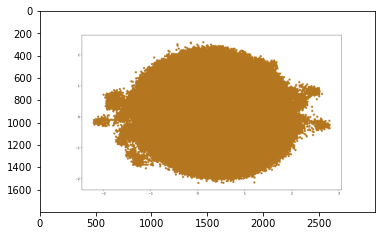

In [21]:
plt.imshow(im)

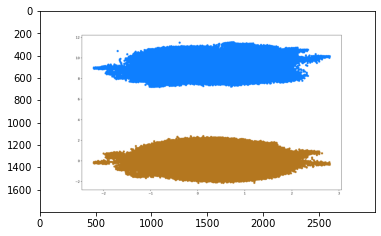

In [23]:
umap_img  = 'umap_emd02.png'
im = cv2.imread(os.path.join(rootdir, umap_img))
plt.imshow(im)

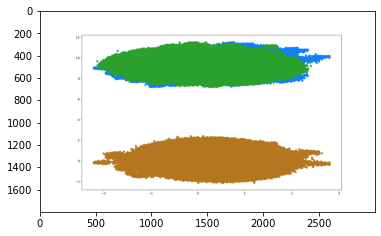

In [24]:
umap_img  = 'umap_emd12.png'
im = cv2.imread(os.path.join(rootdir, umap_img))
plt.imshow(im)



In [33]:

df_umap = pd.read_csv(os.path.join(rootdir, 'umap_emd.csv'))

In [34]:
df_umap_v = df_umap.iloc[:,1:]

In [35]:
df_umap_v.head()

,0,1,2,filename
0,1.849940,0.706601,8.221827,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...
1,1.730748,0.954708,8.038819,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...
2,1.712265,0.810888,8.239088,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...
3,1.947207,0.799875,8.156803,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...
4,1.235549,0.517636,7.946817,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...


In [36]:
df_umap_v = df_umap_v.iloc[:,:3]

In [38]:
df_umap_v.head()

,0,1,2
0,1.849940,0.706601,8.221827
1,1.730748,0.954708,8.038819
2,1.712265,0.810888,8.239088
3,1.947207,0.799875,8.156803
4,1.235549,0.517636,7.946817


<IPython.core.display.Javascript object>


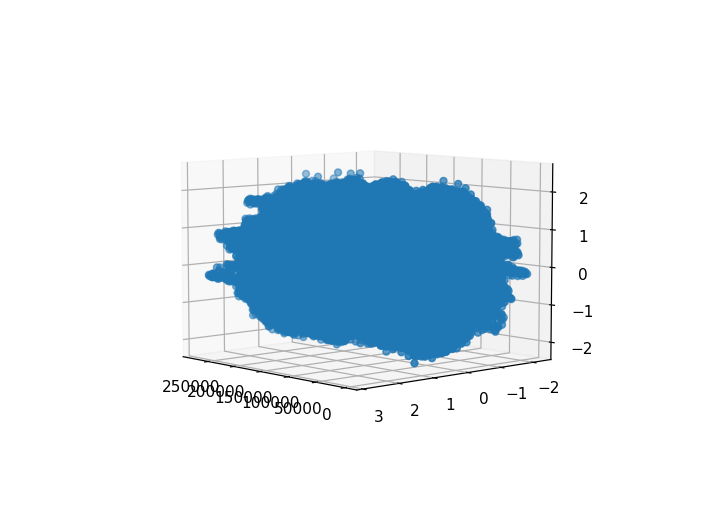

In [39]:
%matplotlib notebook
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.scatter(
    df_umap.iloc[:, 0],
    df_umap.iloc[:, 1],
    df_umap.iloc[:, 2], 
)


In [150]:
kmeans = cluster.KMeans(n_clusters=1)
kmeans_labels = kmeans.fit_predict(df_umap.iloc[:,1:4])

In [151]:
centroids  = kmeans.cluster_centers_

In [152]:
centroids

array([[0.3124824 , 0.16876391, 9.2609741 ]])

In [153]:
df_umap.head()

,Unnamed: 0,0,1,2,filename,Kmeans
0,0,1.849940,0.706601,8.221827,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,1
1,1,1.730748,0.954708,8.038819,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,1
2,2,1.712265,0.810888,8.239088,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,1
3,3,1.947207,0.799875,8.156803,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,1
4,4,1.235549,0.517636,7.946817,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,1


<IPython.core.display.Javascript object>


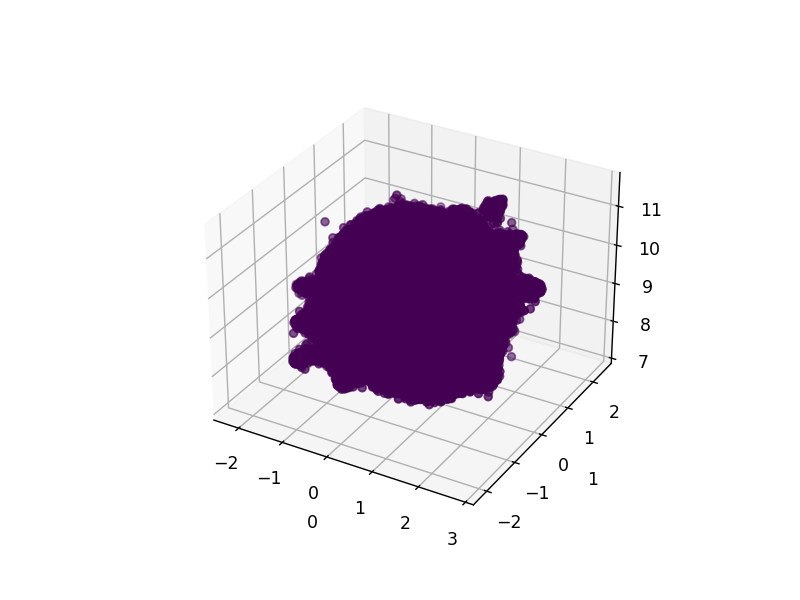

Text(0.5, 0, '1')

In [155]:
%matplotlib notebook
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.scatter(
    df_umap.iloc[:, 1],
    df_umap.iloc[:, 2],
    df_umap.iloc[:, 3],
    c = kmeans_labels,
    label = kmeans_labels
)
ax.set_xlabel('0')
ax.set_ylabel('1')

In [156]:
df_umap['Kmeans'] = kmeans_labels

In [157]:
df_umap_0 = df_umap[df_umap['Kmeans'] == 0]

In [158]:
centroids[0,]

array([0.3124824 , 0.16876391, 9.2609741 ])

In [159]:
import math
dist_centre_0 = []
for i in range(df_umap_0.shape[0]):
    dist_centre_0.append(math.sqrt( (df_umap_0.iloc[i,1] - centroids[0,0]) **2 +
             (df_umap_0.iloc[i,2] - centroids[0,1]) **2 +
             (df_umap_0.iloc[i,3] - centroids[0,2]) **2
            ))

In [160]:
df_umap_0['distance_to_centroid'] = dist_centre_0

In [165]:
to_print_c0 = list(df_umap_0.sort_values(by ='distance_to_centroid',axis= 0, ascending=True)['filename'].values[500:520])

<IPython.core.display.Javascript object>


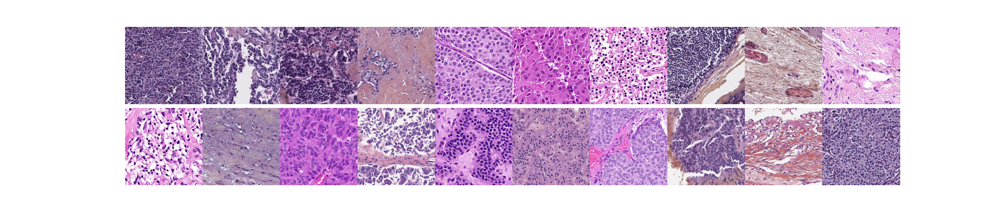

In [166]:
 c  = 0 
fig, axs = plt.subplots(2,10, figsize=(19, 4), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace =0, wspace=0)
row2 = False
for ele in to_print_c0:
    try:
        im = cv2.imread(ele)
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        if row2 == False:
            if c < 10:
                axs[0,c].imshow(im)
                axs[0,c].axis('off')
                c+=1
            elif c == 10:
                c = 0 
                row2 = True
                axs[1,c].imshow(im)
                axs[1,c].axis('off')
                c +=1

        else:
            axs[1,c].imshow(im)
            axs[1,c].axis('off')
            c+=1
    except:
        print(ele)


In [149]:
df_umap_0.head()


,Unnamed: 0,0,1,2,filename,Kmeans,distance_to_centroid
9,9,1.742158,0.207605,9.079347,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,3,2.470273
15,15,-0.127680,-0.558495,7.853662,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,3,1.562737
43,43,0.771113,0.029940,7.731975,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,3,2.119964
47,47,0.910966,-0.014400,8.483578,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,3,1.786146
53,53,1.950225,0.284660,8.223610,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...,3,2.872051


In [62]:
def tiles_in_cluster(cluster_number , clustering_df, ascending=True ):
    '''clustering_df : contain filename '''
    clusteremd_x = clustering_df[clustering_df['Kmeans'] == cluster_number] # purple
    clusteremd_x = clusteremd_x.sort_values(by =  '0',axis= 0, ascending=ascending) # left extremity purple
    # left extremity yellow cluster
    c  = 0 
    fig, axs = plt.subplots(2,10, figsize=(19, 4), facecolor='w', edgecolor='k')
    fig.subplots_adjust(hspace =0, wspace=0)
    row2 = False
    for ele in clusteremd_x['filename'][0:20]:
        try:
            im = cv2.imread(ele)
            im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
            if row2 == False:
                if c < 10:
                    axs[0,c].imshow(im)
                    axs[0,c].axis('off')
                    c+=1
                elif c == 10:
                    c = 0 
                    row2 = True
                    axs[1,c].imshow(im)
                    axs[1,c].axis('off')
                    c +=1

            else:
                axs[1,c].imshow(im)
                axs[1,c].axis('off')
                c+=1
        except:
            print(ele)


<IPython.core.display.Javascript object>


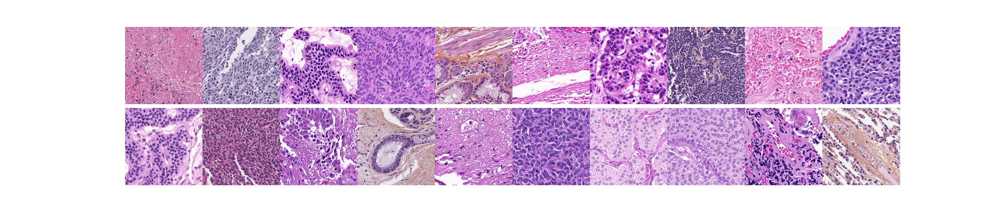

In [63]:

tiles_in_cluster(0, df_umap, ascending=True )

<IPython.core.display.Javascript object>


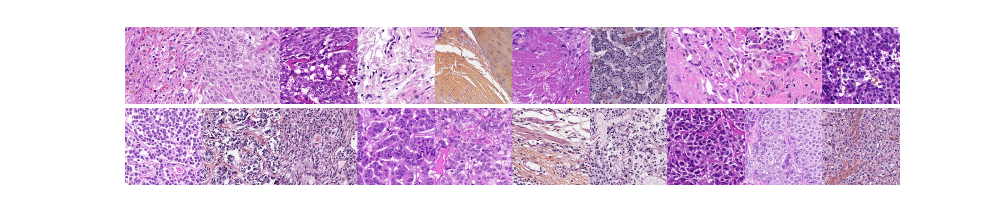

In [65]:
tiles_in_cluster(1, df_umap, ascending
=True )

<IPython.core.display.Javascript object>


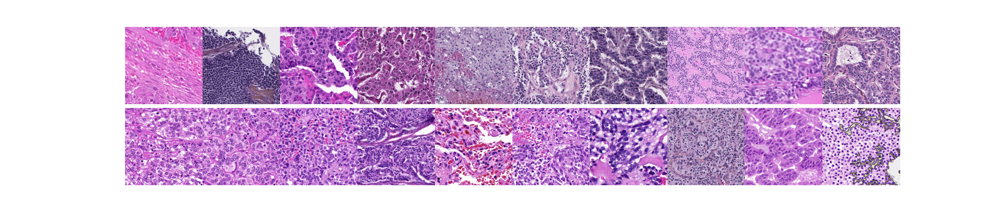

In [66]:
tiles_in_cluster(2, df_umap, ascending
=True )

<IPython.core.display.Javascript object>


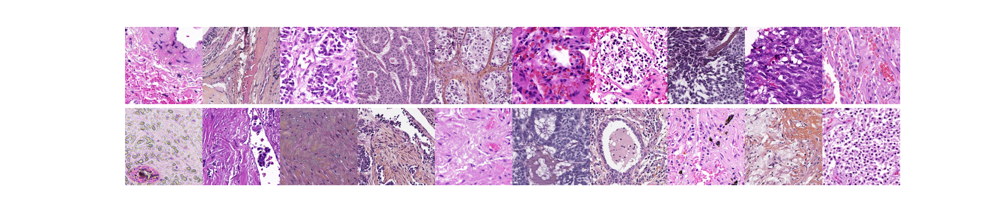

In [67]:
tiles_in_cluster(3, df_umap, ascending
=True )

In [ ]:
# Check LNEN list 

In [70]:
tilesList = pd.read_csv("/gpfsscratch/rech/ohv/ueu39kt/LNEN_Tiles.txt", header= None)

In [71]:
tilesList.head()

,0
0,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...
1,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...
2,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...
3,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...
4,/gpfsscratch/rech/ohv/ueu39kt/Tiles_512_512_18...


In [74]:
tilesList.shape

(1361305, 1)

In [75]:
tilesList =  tilesList.drop_duplicates()
tilesList.shape

(1361305, 1)